## Required Libraries

In [5]:
import zipfile

from IPython.display import display
from PIL import Image
import os

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model



## Unzipping and listing contents of my custom dataset to verify that the extraction was successful

In [ ]:
with zipfile.ZipFile('Projecto Isag.zip', 'r') as zip_ref:
    zip_ref.extractall()

!ls

'Projecto Isag'  'Projecto Isag.zip'   sample_data


## Listing Subdirectories and Displaying Images

Subdirectories in the main directory:
['/content/Projecto Isag/LivrariaLello', '/content/Projecto Isag/MuseuCarroEletrico', '/content/Projecto Isag/PalacioBolsa', '/content/Projecto Isag/IgrejaSaoFrancisco', '/content/Projecto Isag/CasaMusica', '/content/Projecto Isag/MercadoBolhao', '/content/Projecto Isag/CatedralSePorto', '/content/Projecto Isag/TorreClerigos', '/content/Projecto Isag/AvenidaAliados', '/content/Projecto Isag/SaoBento', '/content/Projecto Isag/Serralves', '/content/Projecto Isag/Ribeira']
Contents of the subdirectory: /content/Projecto Isag/LivrariaLello
['/content/Projecto Isag/LivrariaLello/livraria-lello-no-porto.jpg', '/content/Projecto Isag/LivrariaLello/1461762615.jpg', '/content/Projecto Isag/LivrariaLello/livraria_lello_porto001.jpg', '/content/Projecto Isag/LivrariaLello/livraria-lello-1024x683.jpg', '/content/Projecto Isag/LivrariaLello/20200610_3423_Lello.jpg', '/content/Projecto Isag/LivrariaLello/8.jpg', '/content/Projecto Isag/LivrariaLello/gettyimages-

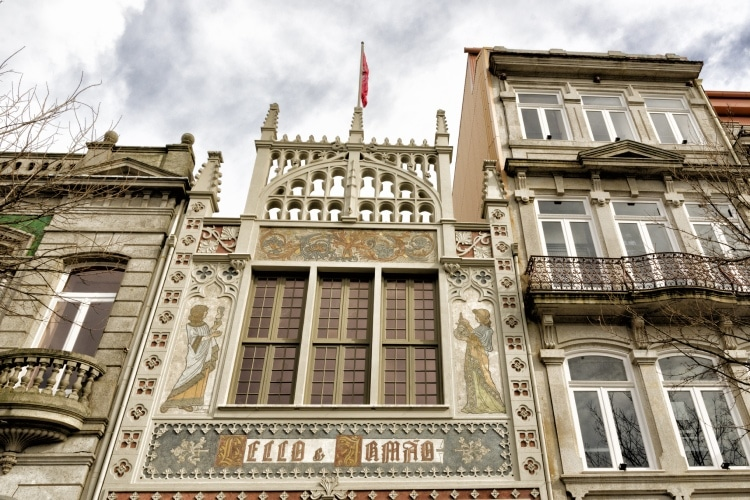

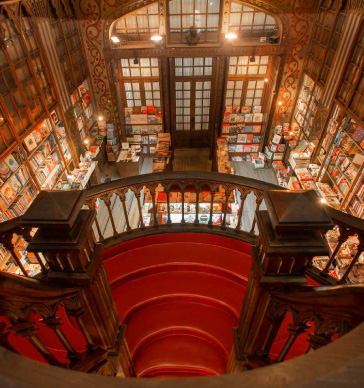

Contents of the subdirectory: /content/Projecto Isag/MuseuCarroEletrico
['/content/Projecto Isag/MuseuCarroEletrico/images (8).jpg', '/content/Projecto Isag/MuseuCarroEletrico/transferir.jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (15).jpg', '/content/Projecto Isag/MuseuCarroEletrico/transferir (2).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (3).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (2).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (10).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (6).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (7).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (12).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (13).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (1).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (14).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images (11).jpg', '/content/Projecto Isag/MuseuCarroEletrico/images.jpg', '/content/Projecto Is

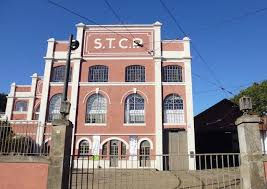

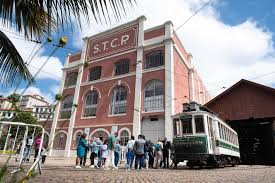

Contents of the subdirectory: /content/Projecto Isag/PalacioBolsa
['/content/Projecto Isag/PalacioBolsa/transferir.jpg', '/content/Projecto Isag/PalacioBolsa/transferir (2).jpg', '/content/Projecto Isag/PalacioBolsa/images (3).jpg', '/content/Projecto Isag/PalacioBolsa/images (2).jpg', '/content/Projecto Isag/PalacioBolsa/transferir (6).jpg', '/content/Projecto Isag/PalacioBolsa/images (6).jpg', '/content/Projecto Isag/PalacioBolsa/images (7).jpg', '/content/Projecto Isag/PalacioBolsa/images (1).jpg', '/content/Projecto Isag/PalacioBolsa/transferir (7).jpg', '/content/Projecto Isag/PalacioBolsa/240913.jpg', '/content/Projecto Isag/PalacioBolsa/transferir (3).jpg', '/content/Projecto Isag/PalacioBolsa/transferir (4).jpg', '/content/Projecto Isag/PalacioBolsa/images.jpg', '/content/Projecto Isag/PalacioBolsa/transferir (10).jpg', '/content/Projecto Isag/PalacioBolsa/transferir (8).jpg', '/content/Projecto Isag/PalacioBolsa/images (4).jpg', '/content/Projecto Isag/PalacioBolsa/images (5).

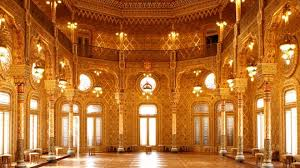

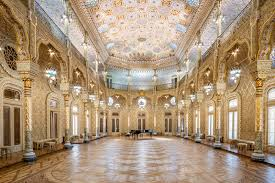

Contents of the subdirectory: /content/Projecto Isag/IgrejaSaoFrancisco
['/content/Projecto Isag/IgrejaSaoFrancisco/images (8).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/images (15).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/transferir (15).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/transferir (11).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/transferir (17).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/images (10).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/transferir (13).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/images (12).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/images (13).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/transferir (14).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/images (1).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/images (14).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/images (11).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/transferir (16).jpg', '/content/Projecto Isag/IgrejaSaoFrancisco/images15

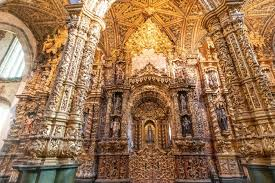

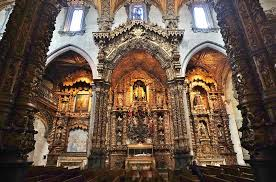

Contents of the subdirectory: /content/Projecto Isag/CasaMusica
['/content/Projecto Isag/CasaMusica/Casa-da-Musica-1-1-1024x683.jpg', '/content/Projecto Isag/CasaMusica/images (3).jpg', '/content/Projecto Isag/CasaMusica/images (2).jpg', '/content/Projecto Isag/CasaMusica/92735_╕_Philippe_Ruault.jpg', '/content/Projecto Isag/CasaMusica/InsidePorto_Casa-da-Musica.jpg', '/content/Projecto Isag/CasaMusica/7807715458_cc6d9b75b7_b.jpg', '/content/Projecto Isag/CasaMusica/casa-da-musica-porto.jpg', '/content/Projecto Isag/CasaMusica/images (1).jpg', '/content/Projecto Isag/CasaMusica/92748_╕_Philippe_Ruault.jpg', '/content/Projecto Isag/CasaMusica/Casa_Da_Musica_(3190746009).jpg', '/content/Projecto Isag/CasaMusica/image.jpg', '/content/Projecto Isag/CasaMusica/Casa-da-Musica-Porto (1).jpg', '/content/Projecto Isag/CasaMusica/casadamusica.jpg', '/content/Projecto Isag/CasaMusica/800px-86724-Porto_(49052540207).jpg', '/content/Projecto Isag/CasaMusica/images.jpg', '/content/Projecto Isag/Casa

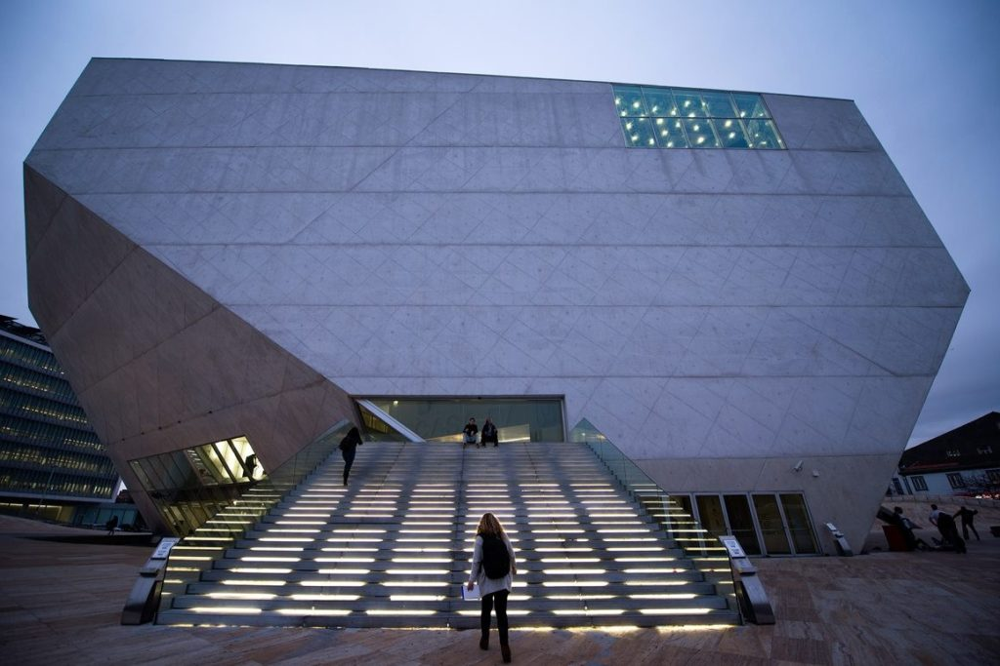

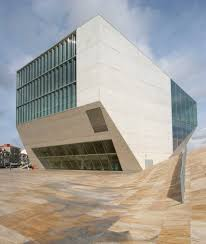

Contents of the subdirectory: /content/Projecto Isag/MercadoBolhao
['/content/Projecto Isag/MercadoBolhao/BOLHAO3.jpg', '/content/Projecto Isag/MercadoBolhao/transferir.jpg', '/content/Projecto Isag/MercadoBolhao/19134629_770x433_acf_cropped.jpg', '/content/Projecto Isag/MercadoBolhao/DSC_0231_-768x506.jpg', '/content/Projecto Isag/MercadoBolhao/44764694_GI16092022ANDREROLO01-copiar-960x640.jpg', '/content/Projecto Isag/MercadoBolhao/photos-10553-17297-mercado_do_bolhao.jpg', '/content/Projecto Isag/MercadoBolhao/mercado-do-bolhao-porto.jpg', '/content/Projecto Isag/MercadoBolhao/ezgif.com-gif-maker-3-768x506.jpg', '/content/Projecto Isag/MercadoBolhao/melhores-coisas-para-fazer-mercado-bolhao.jpg', '/content/Projecto Isag/MercadoBolhao/gco-inauguracao-mercado-do-bolhao-2022-10.jpg', '/content/Projecto Isag/MercadoBolhao/Mercado-do-Bolhao-2023-Porto-╕-Viaje-Comigo.jpg', '/content/Projecto Isag/MercadoBolhao/Bolh╞o2023.jpg', '/content/Projecto Isag/MercadoBolhao/gettyimages-1062303498-6

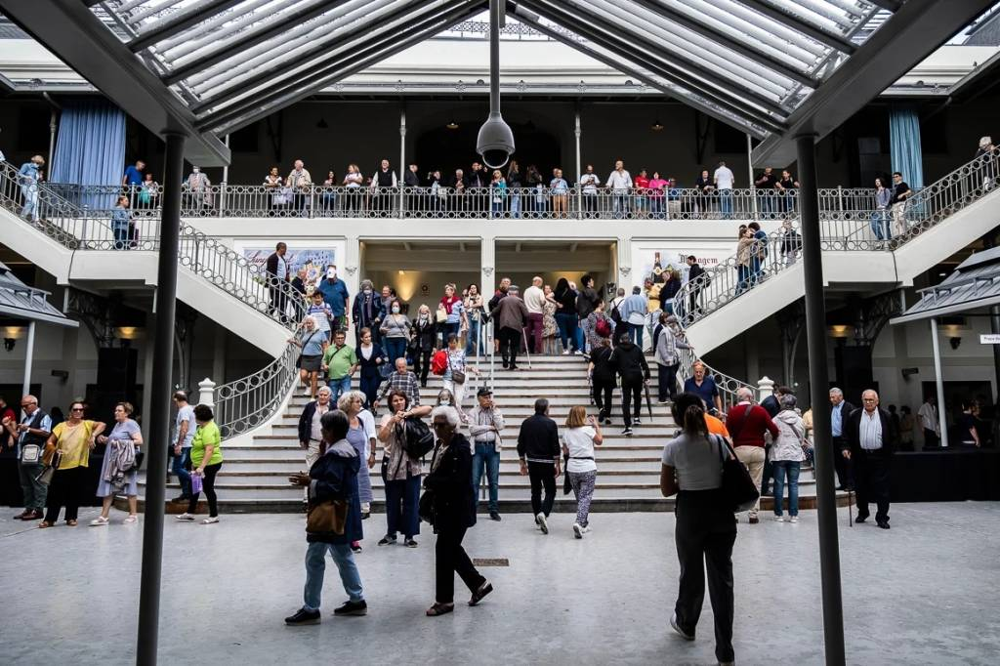

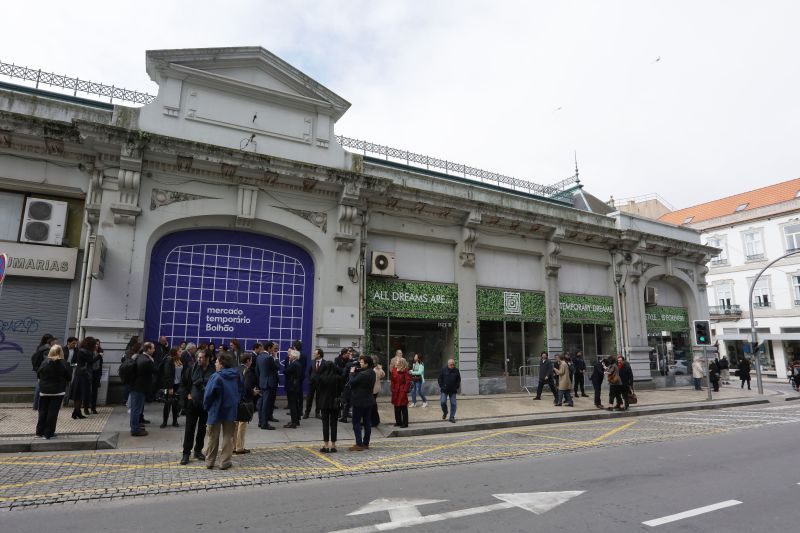

Contents of the subdirectory: /content/Projecto Isag/CatedralSePorto
['/content/Projecto Isag/CatedralSePorto/images (8).jpg', '/content/Projecto Isag/CatedralSePorto/transferir.jpg', '/content/Projecto Isag/CatedralSePorto/transferir (2).jpg', '/content/Projecto Isag/CatedralSePorto/images (3).jpg', '/content/Projecto Isag/CatedralSePorto/images (2).jpg', '/content/Projecto Isag/CatedralSePorto/transferir (6).jpg', '/content/Projecto Isag/CatedralSePorto/images (6).jpg', '/content/Projecto Isag/CatedralSePorto/images (7).jpg', '/content/Projecto Isag/CatedralSePorto/images (1).jpg', '/content/Projecto Isag/CatedralSePorto/transferir (7).jpg', '/content/Projecto Isag/CatedralSePorto/transferir (3).jpg', '/content/Projecto Isag/CatedralSePorto/transferir (4).jpg', '/content/Projecto Isag/CatedralSePorto/images.jpg', '/content/Projecto Isag/CatedralSePorto/images (9).jpg', '/content/Projecto Isag/CatedralSePorto/transferir (8).jpg', '/content/Projecto Isag/CatedralSePorto/images (4).jpg'

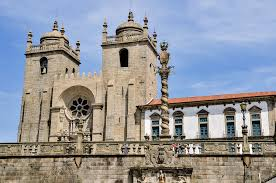

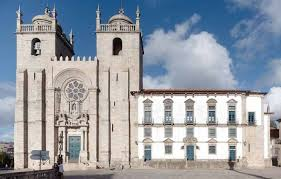

Contents of the subdirectory: /content/Projecto Isag/TorreClerigos
['/content/Projecto Isag/TorreClerigos/photos1-1291-porto_torre_dos_clerigos.jpg', '/content/Projecto Isag/TorreClerigos/148.jpg', '/content/Projecto Isag/TorreClerigos/22453588_BINARY_GI03092015PEDROGRANADEIRO_000003-copiar-960x640.jpg', '/content/Projecto Isag/TorreClerigos/360_F_439811119_lW0pTDKPxgHAfC6g7cWRi1Eag1QedXZF.jpg', '/content/Projecto Isag/TorreClerigos/20150305_bispo_porto_0058.jpg', '/content/Projecto Isag/TorreClerigos/8370783071_5ba5b76b57_c.jpg', '/content/Projecto Isag/TorreClerigos/torre-clerigos.jpg', '/content/Projecto Isag/TorreClerigos/8371852568_c4541033cb_b.jpg', '/content/Projecto Isag/TorreClerigos/Design-sem-nome-17-2.jpg', '/content/Projecto Isag/TorreClerigos/torre-clerigos-porto-1024x642.jpg', '/content/Projecto Isag/TorreClerigos/torre-dos-clerigos-porto.jpg', '/content/Projecto Isag/TorreClerigos/porto-torre-dos-clerigos-no-porto-volta-a-abrir-em-maio-2.jpg', '/content/Projecto Isag/To

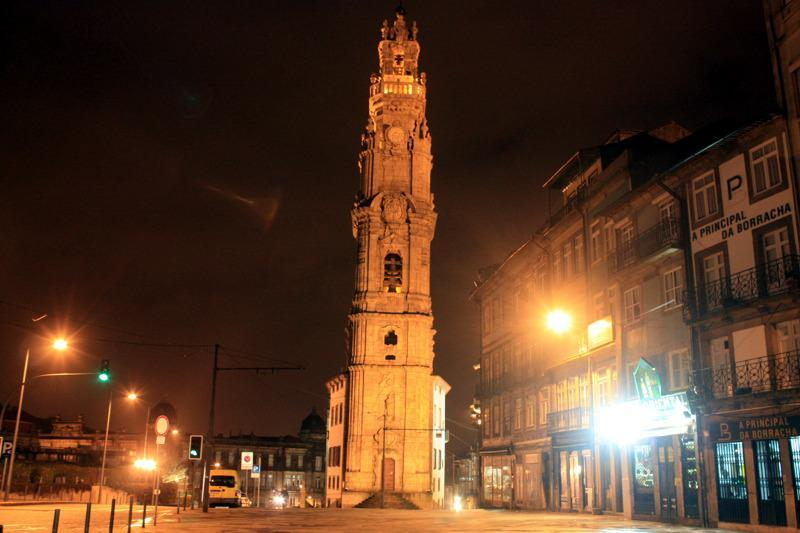

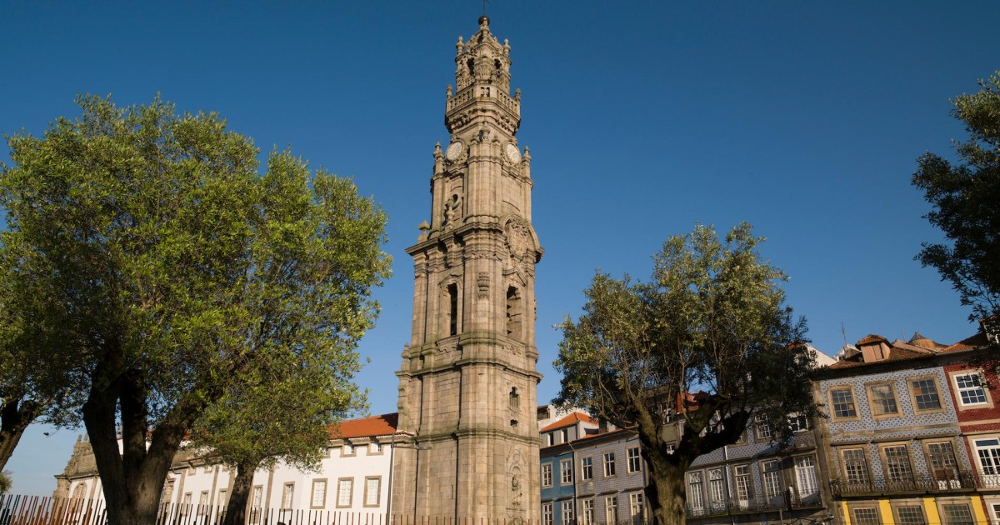

Contents of the subdirectory: /content/Projecto Isag/AvenidaAliados
['/content/Projecto Isag/AvenidaAliados/Escultura_Menina_Nua_na_Avenida_dos_Aliados-682x1024.jpg', '/content/Projecto Isag/AvenidaAliados/transferir.jpg', '/content/Projecto Isag/AvenidaAliados/images (3).jpg', '/content/Projecto Isag/AvenidaAliados/av-aliados-800x450.jpg', '/content/Projecto Isag/AvenidaAliados/images (2).jpg', '/content/Projecto Isag/AvenidaAliados/Portugal_(15435766568).jpg', '/content/Projecto Isag/AvenidaAliados/low-angle-view-avenida-dos-aliados-against-sky_1048944-25154534.jpg', '/content/Projecto Isag/AvenidaAliados/images (1).jpg', '/content/Projecto Isag/AvenidaAliados/port-4679829_640.jpg', '/content/Projecto Isag/AvenidaAliados/avenida_aliados_wiki_destaque.jpg', '/content/Projecto Isag/AvenidaAliados/image.jpg', '/content/Projecto Isag/AvenidaAliados/avenida-dos-aliados.jpg', '/content/Projecto Isag/AvenidaAliados/a31122e8-a070-4ee7-a776-e65d5c14fd87.jpg', '/content/Projecto Isag/AvenidaAl

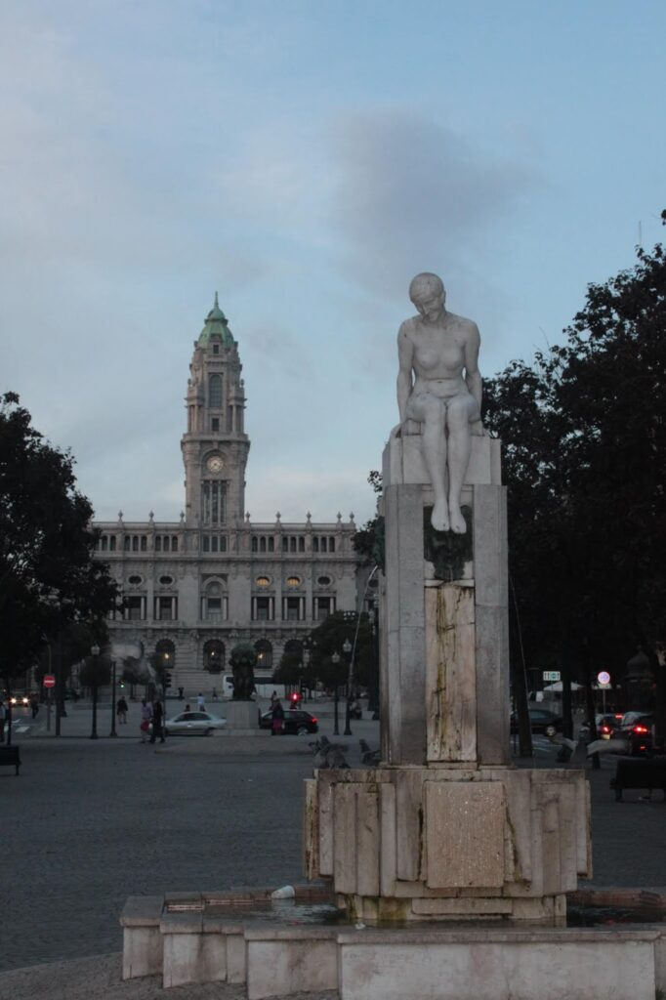

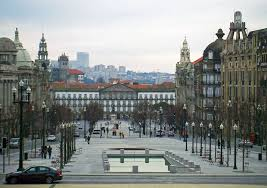

Contents of the subdirectory: /content/Projecto Isag/SaoBento
['/content/Projecto Isag/SaoBento/images (8).jpg', '/content/Projecto Isag/SaoBento/transferir.jpg', '/content/Projecto Isag/SaoBento/transferir (2).jpg', '/content/Projecto Isag/SaoBento/images (3).jpg', '/content/Projecto Isag/SaoBento/images (2).jpg', '/content/Projecto Isag/SaoBento/transferir (6).jpg', '/content/Projecto Isag/SaoBento/images (6).jpg', '/content/Projecto Isag/SaoBento/images (7).jpg', '/content/Projecto Isag/SaoBento/images (1).jpg', '/content/Projecto Isag/SaoBento/transferir (7).jpg', '/content/Projecto Isag/SaoBento/transferir (3).jpg', '/content/Projecto Isag/SaoBento/transferir (4).jpg', '/content/Projecto Isag/SaoBento/images.jpg', '/content/Projecto Isag/SaoBento/images (9).jpg', '/content/Projecto Isag/SaoBento/transferir (10).jpg', '/content/Projecto Isag/SaoBento/transferir (8).jpg', '/content/Projecto Isag/SaoBento/images (4).jpg', '/content/Projecto Isag/SaoBento/images (5).jpg', '/content/Pr

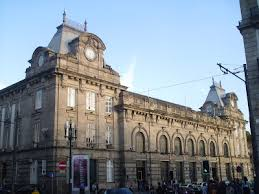

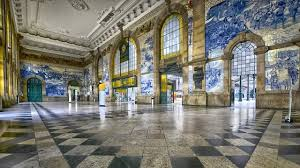

Contents of the subdirectory: /content/Projecto Isag/Serralves
['/content/Projecto Isag/Serralves/transferir.jpg', '/content/Projecto Isag/Serralves/transferir (2).jpg', '/content/Projecto Isag/Serralves/images (3).jpg', '/content/Projecto Isag/Serralves/transferir (11).jpg', '/content/Projecto Isag/Serralves/images (2).jpg', '/content/Projecto Isag/Serralves/transferir (6).jpg', '/content/Projecto Isag/Serralves/images (6).jpg', '/content/Projecto Isag/Serralves/images (7).jpg', '/content/Projecto Isag/Serralves/images (1).jpg', '/content/Projecto Isag/Serralves/transferir (7).jpg', '/content/Projecto Isag/Serralves/transferir (3).jpg', '/content/Projecto Isag/Serralves/transferir (4).jpg', '/content/Projecto Isag/Serralves/images.jpg', '/content/Projecto Isag/Serralves/transferir (10).jpg', '/content/Projecto Isag/Serralves/transferir (8).jpg', '/content/Projecto Isag/Serralves/images (4).jpg', '/content/Projecto Isag/Serralves/images (5).jpg', '/content/Projecto Isag/Serralves/trans

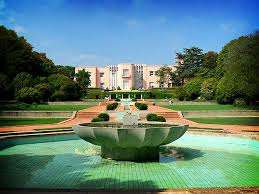

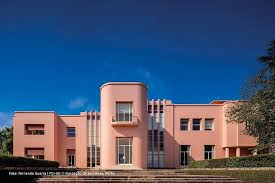

Contents of the subdirectory: /content/Projecto Isag/Ribeira
['/content/Projecto Isag/Ribeira/images (8).jpg', '/content/Projecto Isag/Ribeira/transferir.jpg', '/content/Projecto Isag/Ribeira/transferir (2).jpg', '/content/Projecto Isag/Ribeira/images (3).jpg', '/content/Projecto Isag/Ribeira/images (2).jpg', '/content/Projecto Isag/Ribeira/transferir (6).jpg', '/content/Projecto Isag/Ribeira/images (6).jpg', '/content/Projecto Isag/Ribeira/images (7).jpg', '/content/Projecto Isag/Ribeira/images (1).jpg', '/content/Projecto Isag/Ribeira/transferir (7).jpg', '/content/Projecto Isag/Ribeira/transferir (3).jpg', '/content/Projecto Isag/Ribeira/transferir (4).jpg', '/content/Projecto Isag/Ribeira/1024px-Porto_-_Ribeira_desde_cais_de_Gaia.jpg', '/content/Projecto Isag/Ribeira/images.jpg', '/content/Projecto Isag/Ribeira/transferir (8).jpg', '/content/Projecto Isag/Ribeira/images (4).jpg', '/content/Projecto Isag/Ribeira/images (5).jpg', '/content/Projecto Isag/Ribeira/transferir (1).jpg', '

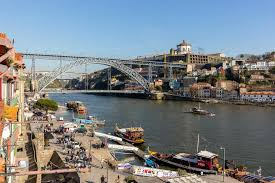

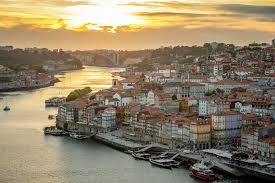

In [6]:


# Directory containing directories with images
main_directory = "/content/Projecto Isag"

# Check if the main directory exists
if not os.path.exists(main_directory):
    print("Main directory not found:", main_directory)
else:
    # List the contents of the main directory
    sub_directories = [os.path.join(main_directory, d) for d in os.listdir(main_directory)]
    print("Subdirectories in the main directory:")
    print(sub_directories)

    # Iterate over subdirectories
    for sub_directory in sub_directories:
        # Check if the subdirectory is indeed a directory
        if os.path.isdir(sub_directory):
            # List the contents of the subdirectory
            files = [os.path.join(sub_directory, f) for f in os.listdir(sub_directory)]
            print("Contents of the subdirectory:", sub_directory)
            print(files)

            # Counter for images displayed per class
            images_displayed = 0

            # Iterate over files in the subdirectory
            for file_path in files:
                try:
                    img = Image.open(file_path)
                    display(img)
                    images_displayed += 1

                    # Check if we've displayed two images already for this class
                    if images_displayed == 2:
                        break  # Exit the loop for this class
                except Exception as e:
                    print(f"Error displaying image {file_path}: {e}")
        else:
            print(f"{sub_directory} is not a directory.")




## Image Preprocessing and Dataset Splitting

In [7]:


# Define image dimensions
img_width, img_height = 224, 224

# Initialize lists to store images and labels
images = []
labels = []

# Iterate over subdirectories
for sub_directory in sub_directories:
    # Check if the subdirectory is indeed a directory
    if os.path.isdir(sub_directory):
        # Extract class label from subdirectory name
        class_label = os.path.basename(sub_directory)

        # List the contents of the subdirectory
        files = [os.path.join(sub_directory, f) for f in os.listdir(sub_directory)]

        # Iterate over files in the subdirectory
        for file_path in files:
            try:
                # Load and preprocess image
                img = Image.open(file_path)
                img = img.convert('RGB')  # Convert to RGB mode
                img = img.resize((img_width, img_height))  # Resize image
                img_array = np.array(img) / 255.0  # Normalize pixel values
                images.append(img_array)
                labels.append(class_label)
                print("Image index:", len(images)-1, "Shape:", img_array.shape)  # Print image index and shape
            except Exception as e:
                print(f"Error processing image {file_path}: {e}")

# Convert lists to numpy arrays
images = np.array(images)

# Initialize label encoder
label_encoder = LabelEncoder()

# Encode class labels
labels_encoded = label_encoder.fit_transform(labels)

# Split dataset into training and validation sets
train_images, val_images, train_labels, val_labels = train_test_split(images, labels_encoded, test_size=0.2, random_state=42)

# Print shapes of datasets
print("Training images shape:", train_images.shape)
print("Training labels shape:", train_labels.shape)
print("Validation images shape:", val_images.shape)
print("Validation labels shape:", val_labels.shape)




Image index: 0 Shape: (224, 224, 3)
Image index: 1 Shape: (224, 224, 3)
Image index: 2 Shape: (224, 224, 3)
Image index: 3 Shape: (224, 224, 3)
Image index: 4 Shape: (224, 224, 3)
Image index: 5 Shape: (224, 224, 3)
Image index: 6 Shape: (224, 224, 3)
Image index: 7 Shape: (224, 224, 3)
Image index: 8 Shape: (224, 224, 3)
Image index: 9 Shape: (224, 224, 3)
Image index: 10 Shape: (224, 224, 3)
Image index: 11 Shape: (224, 224, 3)
Image index: 12 Shape: (224, 224, 3)
Image index: 13 Shape: (224, 224, 3)
Image index: 14 Shape: (224, 224, 3)
Image index: 15 Shape: (224, 224, 3)
Image index: 16 Shape: (224, 224, 3)
Image index: 17 Shape: (224, 224, 3)
Image index: 18 Shape: (224, 224, 3)
Image index: 19 Shape: (224, 224, 3)
Image index: 20 Shape: (224, 224, 3)
Image index: 21 Shape: (224, 224, 3)
Image index: 22 Shape: (224, 224, 3)
Image index: 23 Shape: (224, 224, 3)
Image index: 24 Shape: (224, 224, 3)
Image index: 25 Shape: (224, 224, 3)
Image index: 26 Shape: (224, 224, 3)
Image index

## Visualizing Preprocessed Image Samples

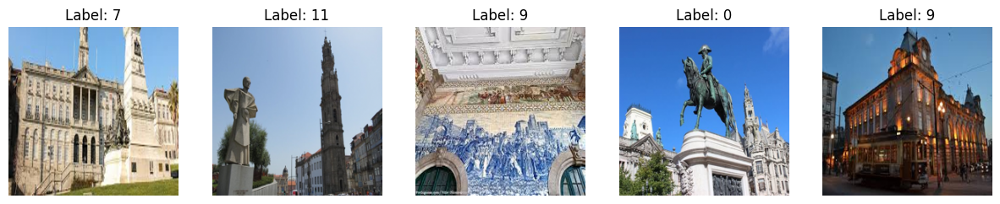

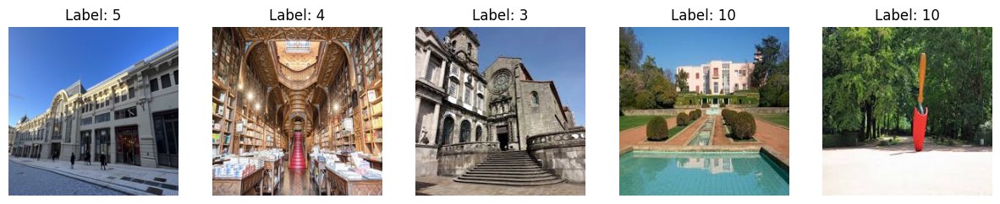

In [ ]:


# Number of images to be displayed
num_images_to_display = 5

# Display the training images with labels
plt.figure(figsize=(15, 3))
for i in range(num_images_to_display):
    plt.subplot(1, num_images_to_display, i + 1)
    plt.imshow(train_images[i])
    plt.title(f"Label: {train_labels[i]}")
    plt.axis('off')
plt.show()

# Display the validation images with labels
plt.figure(figsize=(15, 3))
for i in range(num_images_to_display):
    plt.subplot(1, num_images_to_display, i + 1)
    plt.imshow(val_images[i])
    plt.title(f"Label: {val_labels[i]}")
    plt.axis('off')
plt.show()




## Building Transfer Learning Model with Pre-trained VGG16

In [ ]:


# Loading the pre-trained VGG16 model without the top (fully connected) layers
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freezing the weights of the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Defining the number of classes
num_classes = 12

# Adding the final layers to the base model
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
output = Dense(num_classes, activation='softmax')(x)

# Creating the final model
model = Model(inputs=base_model.input, outputs=output)



## Model Architecture Summary

In [ ]:
model.summary()


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

## Model Compilation and Training

In [ ]:
# Compiling the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])


train_data = train_images
train_labels = train_labels
val_data = val_images
val_labels = val_labels

# Training the model
history = model.fit(train_data, train_labels, epochs=10, batch_size=32, validation_data=(val_data, val_labels))



Epoch 1/10
6/6 [==============================] - 146s 25s/step - loss: 5.2539 - accuracy: 0.2135 - val_loss: 2.2694 - val_accuracy: 0.5208
Epoch 2/10
6/6 [==============================] - 139s 25s/step - loss: 1.7489 - accuracy: 0.6250 - val_loss: 2.1309 - val_accuracy: 0.3958
Epoch 3/10
6/6 [==============================] - 139s 25s/step - loss: 0.4409 - accuracy: 0.8698 - val_loss: 0.5067 - val_accuracy: 0.9167
Epoch 4/10
6/6 [==============================] - 141s 25s/step - loss: 0.1350 - accuracy: 0.9948 - val_loss: 0.5810 - val_accuracy: 0.8750
Epoch 5/10
6/6 [==============================] - 139s 25s/step - loss: 0.0481 - accuracy: 1.0000 - val_loss: 0.6718 - val_accuracy: 0.7500
Epoch 6/10
6/6 [==============================] - 140s 24s/step - loss: 0.0242 - accuracy: 1.0000 - val_loss: 0.5203 - val_accuracy: 0.8125
Epoch 7/10
6/6 [==============================] - 141s 25s/step - loss: 0.0093 - accuracy: 1.0000 - val_loss: 0.4034 - val_accuracy: 0.8958
Epoch 8/10
6/6 [====

## Training and Validation Accuracy Visualization

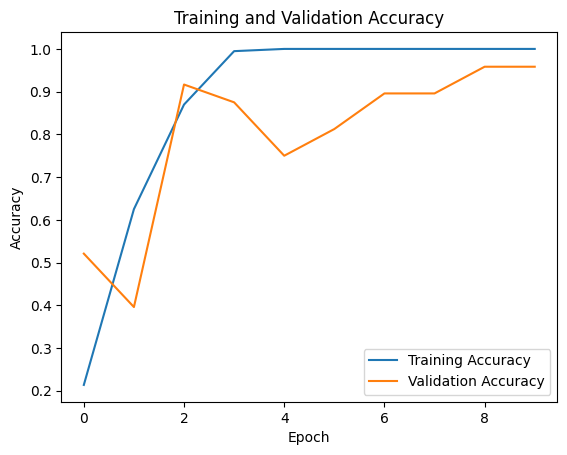

In [ ]:


# Getting training and validation accuracy of the model
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

# Plotting training and validation accuracy
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()


## Random Example Prediction Visualization

1/1 [==============================] - 0s 489ms/step


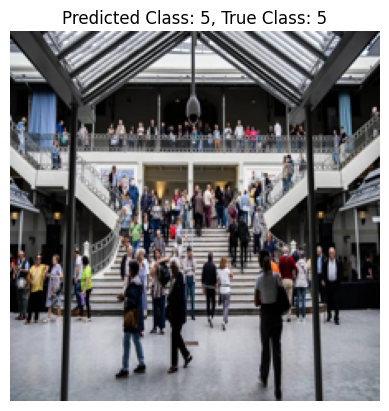

1/1 [==============================] - 0s 495ms/step


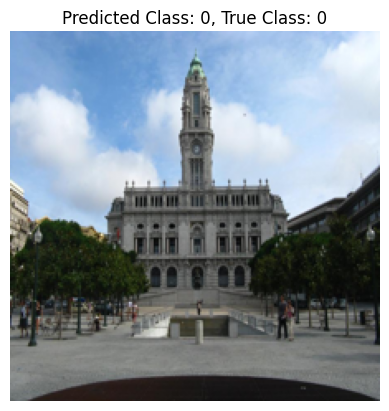

1/1 [==============================] - 0s 494ms/step


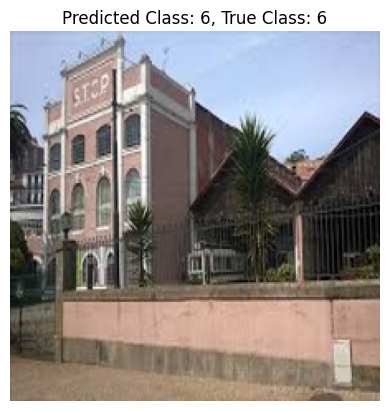

1/1 [==============================] - 1s 602ms/step


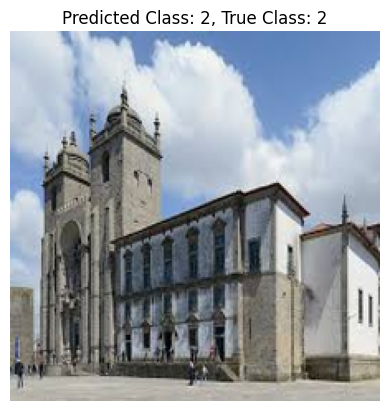

1/1 [==============================] - 1s 513ms/step


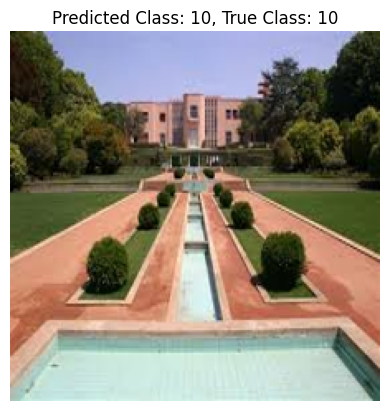

1/1 [==============================] - 1s 760ms/step


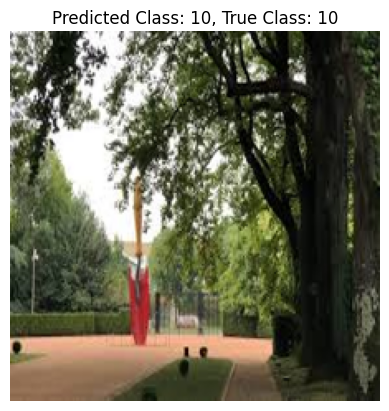

1/1 [==============================] - 1s 898ms/step


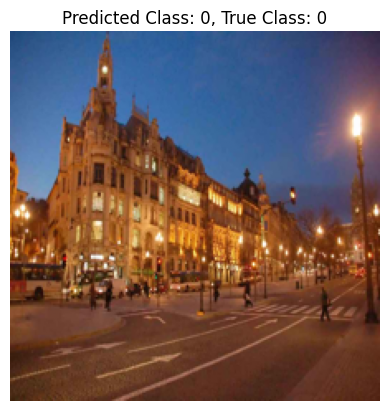

1/1 [==============================] - 1s 724ms/step


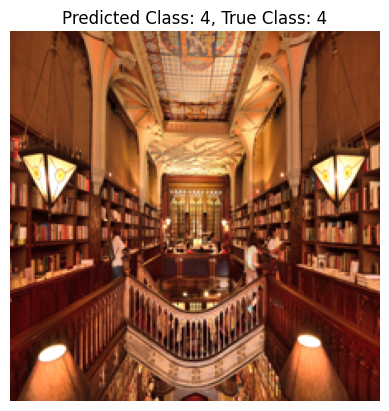

1/1 [==============================] - 1s 539ms/step


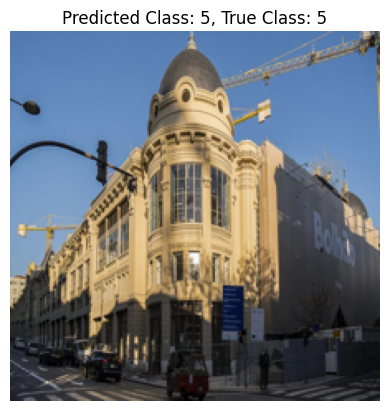

1/1 [==============================] - 1s 550ms/step


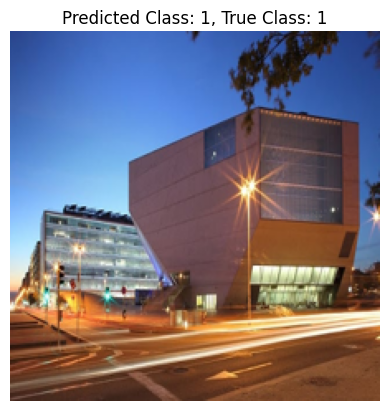

1/1 [==============================] - 1s 585ms/step


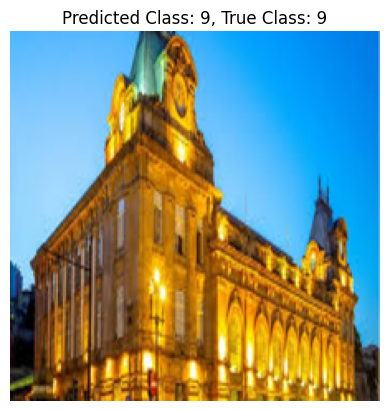

1/1 [==============================] - 1s 522ms/step


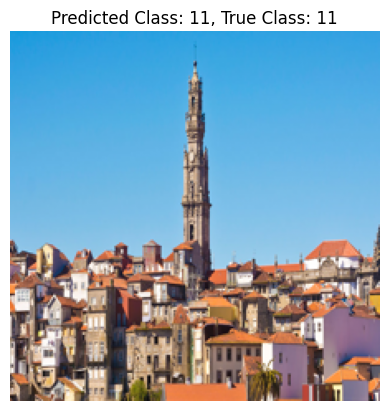

1/1 [==============================] - 1s 516ms/step


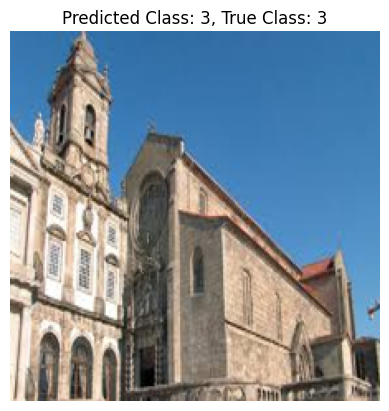

In [ ]:


# Defining the number of examples to display
num_examples = 13

# Selecting random indices from the validation set
random_indices = np.random.choice(len(val_images), num_examples, replace=False)

# Iterating over the selected indices
for idx in random_indices:
    # Select the corresponding image and label from the validation set
    selected_image = val_images[idx]
    selected_label = val_labels[idx]

    # Make predictions
    predictions = model.predict(np.expand_dims(selected_image, axis=0))
    predicted_class_idx = np.argmax(predictions[0])

    # Display the image and prediction
    plt.imshow(selected_image)
    plt.axis('off')
    plt.title(f'Predicted Class: {predicted_class_idx}, True Class: {selected_label}')
    plt.show()

